
<img src="https://raw.githubusercontent.com/hectormelo/Machine-Learning-Techniques/main/Banner.png" ><br>
# Machine Learning Techniques - MISIS4219

Primer semestre - 2024

## Integrantes

*   Andrés Felipe Aristizábal Miranda - 202416947.
*   Leandro Rodríguez Llosa - 202410038.

Uno de los fenómenos más grandes que se presentan hoy en día son las opiniones de los usuarios sobre diferentes temas a través de Internet. Esta opinión es muy valiosa ya que permite saber en tiempo real y de primera mano los sentimientos que tienen las personas sobre un producto o servicio.

Es por ello, que una cadena hotelera en Andalucía ha decidido extraer la información de las opiniones de sus usuarios que han publicado en internet. Con el fin de poder entender cuáles son las ideas principales de los usuarios acerca de sus servicios, qué aspectos resaltan ellos sobre su servicios y, lo más importante, saber en qué pueden mejorar. Además, con este banco de datos esperan poder entrenar un modelo que les permita automáticamente determinar el sentimiento del usuario basado en las nuevas opiniones que puedan dejar.

Para poder tomar decisiones en este estudio, se debe presentar:

* Un análisis de las palabras más importantes en cada una de las categorías que le den relevancia a la cadena hotelera.

* Un proceso de limpieza y transformación de datos idóneo para el entrenamiento de los algoritmos.

* Una tabla comparativa, mostrando el rendimiento los dos mejores modelos entrenados con Naïve Bayes y KNN.

* A partir de la tabla comparativa, ¿cuál modelo ofrece el mejor rendimiento sobre el conjunto test? ¿Qué interpretación puedes darles a los valores obtenidos sobre las métricas de rendimiento?


**Datos**: Big_AHR.csv

## Diccionario de Datos

Se dan a disposición 13330 reviews de los usuarios los caules están compuestos de la siguiente forma:

* **Review’s title**: Título del review dado por el usuario.
* **5-scale rating**: Calificación del usuario. Escala de 1 a 5.
* **Text**: Review del usuario.
* **City_Region**: Región donde pertenece el hotel.
* **Hotel’s name**: Nombre del hotel evaluado.
* **Binary sentiment label** Clasificación sentimental. Donde 0 es Negativo, 1 es Positivo y 3 es Neutral.

Este es un modelo base, en este caso se realizó la predicción sobre el rating que podría dar un usuario.

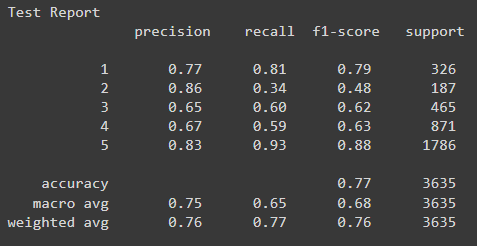

## **1. Instalaciones e importaciones**

In [ ]:
%pip install ydata-profiling contractions nltk wordcloud

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Pac

[nltk_data]    |   Package moses_sample is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package mte_teip5 to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package mte_teip5 is already up-to-date!
[nltk_data]    | Downloading package mwa_ppdb to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package mwa_ppdb is already up-to-date!
[nltk_data]    | Downloading package names to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Downloading package nombank.1.0 to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package nombank.1.0 is already up-to-date!
[nltk_data]    | Downloading package nonbreaking_prefixes to
[nlt

[nltk_data]    |   Package udhr2 is already up-to-date!
[nltk_data]    | Downloading package unicode_samples to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package unicode_samples is already up-to-date!
[nltk_data]    | Downloading package universal_tagset to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package universal_tagset is already up-to-date!
[nltk_data]    | Downloading package universal_treebanks_v20 to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package universal_treebanks_v20 is already up-to-
[nltk_data]    |       date!
[nltk_data]    | Downloading package vader_lexicon to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package vader_lexicon is already up-to-date!
[nltk_data]    | Downloading package verbnet to
[nltk_data]    |     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]    |   Package verbnet is already up-t

True

In [ ]:
import nltk
nltk.download('all')

In [ ]:
#Manejo de datos
import pandas as pd
import numpy as np
import re

#Visualización de datos
import matplotlib.pyplot as plt
import itertools
%matplotlib inline

import re, string, unicodedata
import contractions
#import inflect
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer

#Analisis profundo de datos
from ydata_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier

# Librería para la creación de nube de etiquetas -Wordcloud.
from wordcloud import WordCloud

## **2. Entendimiento del Negocio**

La empresa busca extraer y analizar las opiniones de sus usuarios publicadas en Internet para entender mejor los sentimientos de sus clientes respecto a sus servicios. Este análisis es fundamental por varias razones:

1.   Mejora del servicio y experiencia del cliente: Al analizar las opiniones de los usuarios, la cadena hotelera puede identificar áreas específicas de mejora en sus servicios. Por ejemplo, si varios comentarios resaltan problemas con la limpieza de las habitaciones, la cadena podría enfocarse en mejorar esos estándares.
2.   Desarrollo de productos y servicios: Las opiniones pueden revelar qué aspectos valoran más los clientes, permitiendo a la cadena hotelera ajustar sus ofertas o desarrollar nuevos servicios que satisfagan mejor las necesidades y preferencias de sus huéspedes.
3.   Gestión de la reputación en línea: En la era digital, la percepción de una marca en Internet puede influir significativamente en las decisiones de los consumidores. Al monitorear y responder a las opiniones de los usuarios, la cadena hotelera puede mejorar su reputación en línea, lo que puede traducirse en un aumento de reservas y fidelidad del cliente.
4.   Entrenamiento de modelos de análisis de sentimientos: Al recolectar y analizar estas opiniones, la cadena hotelera no solo obtiene insights valiosos sobre sus servicios, sino que también puede desarrollar un modelo de machine learning para clasificar automáticamente el sentimiento de nuevos comentarios. Esto permite una monitorización en tiempo real de la satisfacción del cliente, agilizando la respuesta a posibles problemas o necesidades.

Para llevar a cabo este proyecto, es crucial realizar un proceso de limpieza y transformación de datos que prepare adecuadamente el conjunto de opiniones para el análisis y el entrenamiento de modelos. Esto incluye la eliminación de ruido en los datos, como errores de ortografía o información irrelevante, y la transformación de los textos en un formato que los algoritmos puedan procesar eficientemente, como vectores numéricos.

El análisis debe enfocarse en identificar palabras clave y temas recurrentes en las opiniones, diferenciando entre comentarios positivos, negativos y neutrales. Este paso es esencial para entender los aspectos que más influyen en la percepción de los clientes sobre la cadena hotelera.

## 3. Entendimiento de los datos

In [ ]:
data = pd.read_csv('https://raw.githubusercontent.com/hectormelo/Machine-Learning-Techniques/main/Taller_3/Big_AHR.csv')
data.head()

,Unnamed: 0,title,rating,review_text,location,hotel,label
0,0,Excelente y personal amable,5,Un hotel muy bueno. El personal fue muy amabl...,Seville_Province_of_Seville_Andalucia,H10_Casa_de_la_Plata,1
1,1,Céntrico,4,"Muy buen hotel al nivel de lo esperado, habita...",Seville_Province_of_Seville_Andalucia,H10_Casa_de_la_Plata,1
2,2,Hotel excepcional,5,Magnífico hotel. La verdad es que todo perfect...,Seville_Province_of_Seville_Andalucia,H10_Casa_de_la_Plata,1
3,3,WOW!!,5,"Hotel hermoso, buen diseño, original, limpio. ...",Seville_Province_of_Seville_Andalucia,H10_Casa_de_la_Plata,1
4,4,Magnifico,5,Magnífica ubicación en pleno centro de Sevilla...,Seville_Province_of_Seville_Andalucia,H10_Casa_de_la_Plata,1


In [ ]:
train, test = train_test_split(data, test_size=0.2, random_state=33, stratify=data['rating'])
train.head()

,Unnamed: 0,title,rating,review_text,location,hotel,label
7415,7415,Una noche y no repetiría.,1,No me gustó nada la experiencia. Ya que fue un...,Granada_Province_of_Granada_Andalucia,Casa_Palacio_Pilar_del_Toro_Hotel,0
6472,6472,Céntrico y cálido,4,Hotel muy recomendable en relación calidad-pre...,Granada_Province_of_Granada_Andalucia,Melia_Granada,1
17502,17502,Mi experiencia en este hotel,4,Hemos pasado tres noches en este hotel de Mala...,NaN,NaN,1
87,87,¡Excelente Hotel!,5,"Es un hotel super bonito, con habitaciones sup...",Seville_Province_of_Seville_Andalucia,Hotel_Posada_del_Lucero,1
14559,14559,Excelente !!!! REPETIREMOS !!!!,5,Los espacios comunes son amplios y transmiten ...,Almedinilla_Province_of_Cordoba_Andalucia,Hospederia_la_Era,1


In [ ]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
def mostrar_grafico(palabras,stopwords=[]):
    comment_words = ''

    # iterate through the csv file
    for val in palabras:

        # typecaste each val to string
        val = str(val)

        # split the value
        tokens = val.split()

        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()

        comment_words += " ".join(tokens)+" "

    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)

    # plot the WordCloud image
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()

### WordCloud

---------- Words for class: 1 ----------


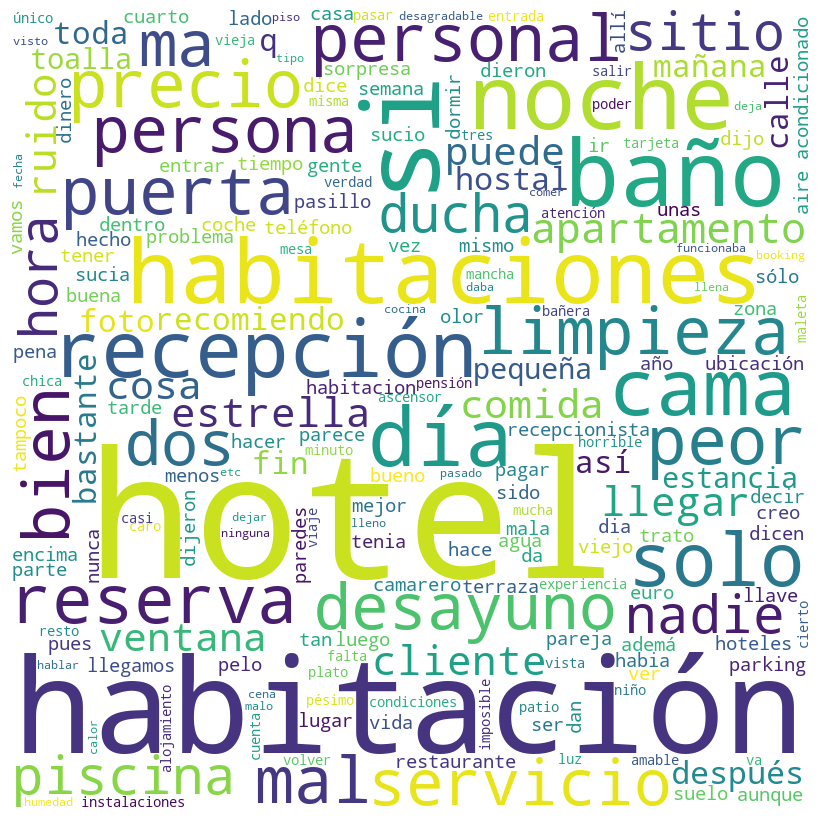

---------- Words for class: 4 ----------


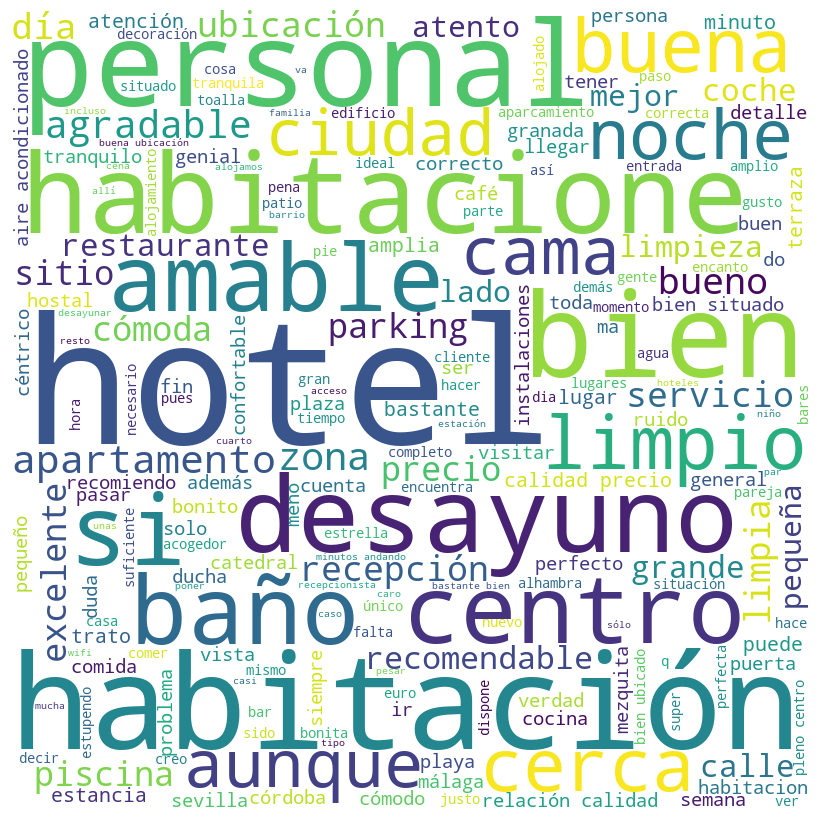

---------- Words for class: 5 ----------


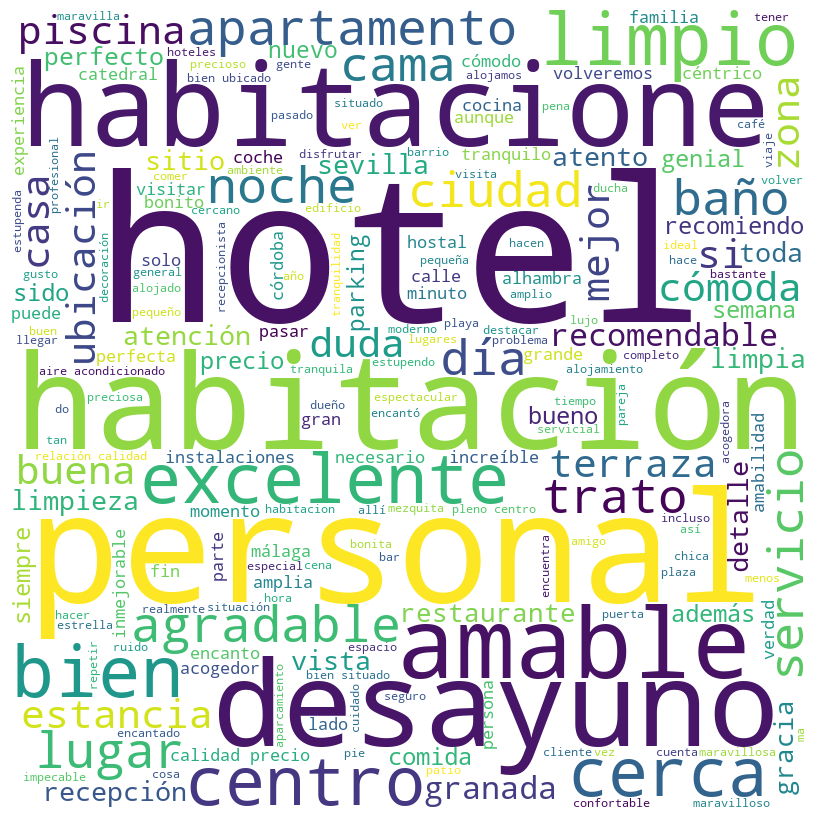

---------- Words for class: 3 ----------


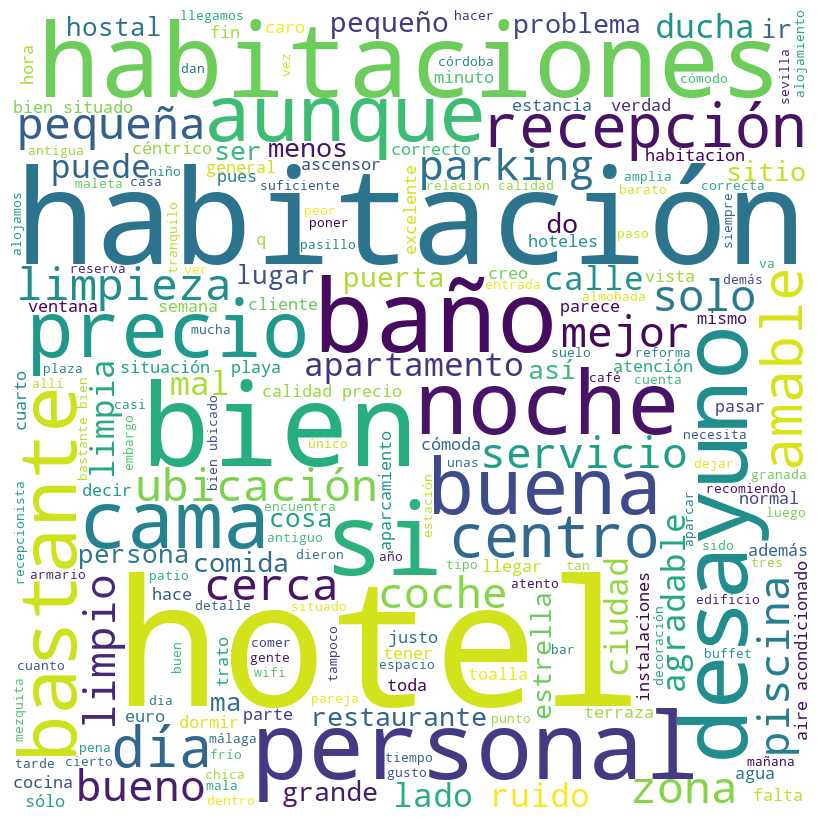

---------- Words for class: 2 ----------


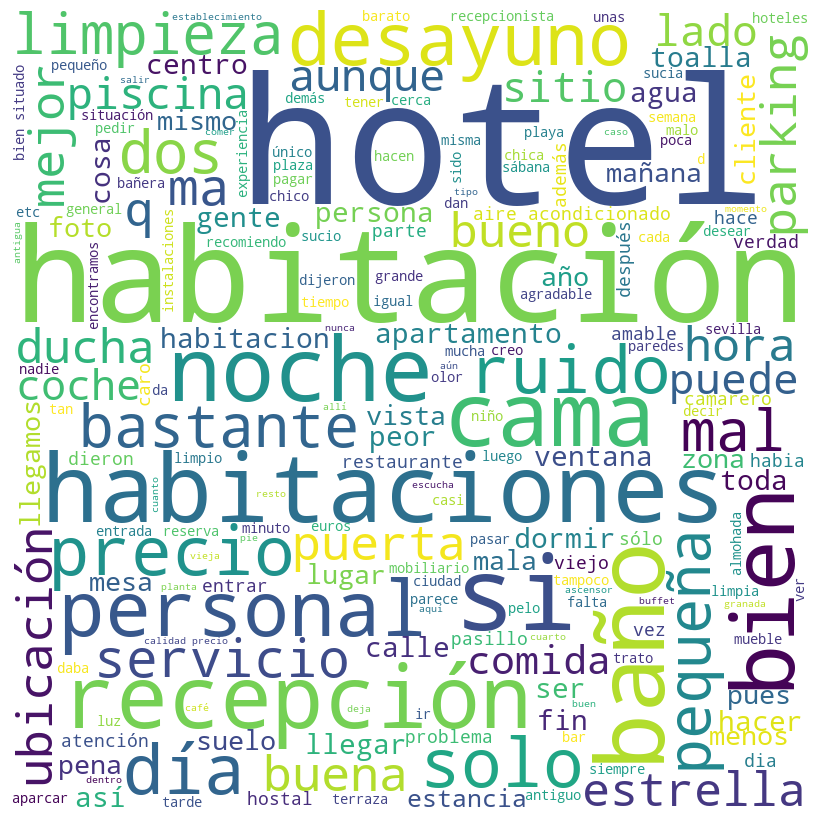

In [ ]:
stop_words = stopwords.words('spanish')

for i in train['rating'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['rating']==i,'review_text'], stopwords=stop_words)

---------- Words for class: 0 ----------


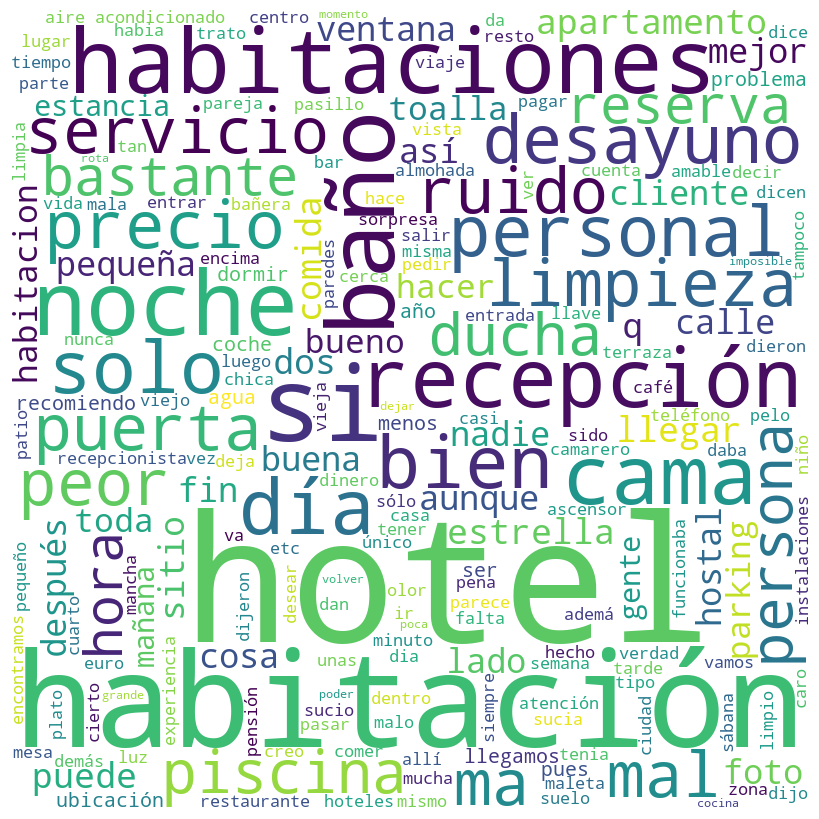

---------- Words for class: 1 ----------


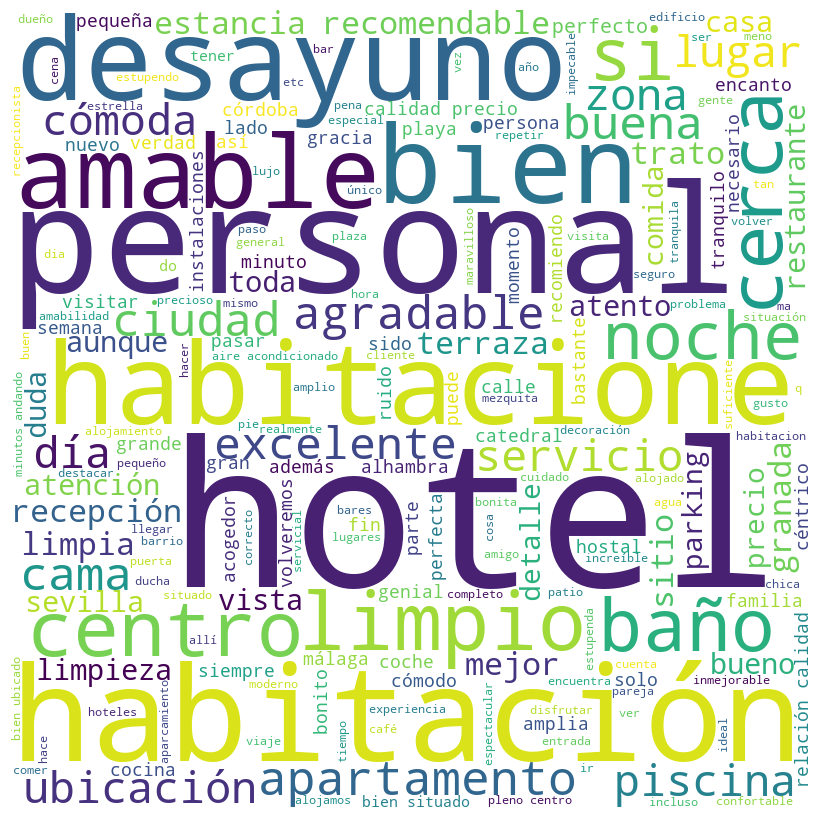

---------- Words for class: 3 ----------


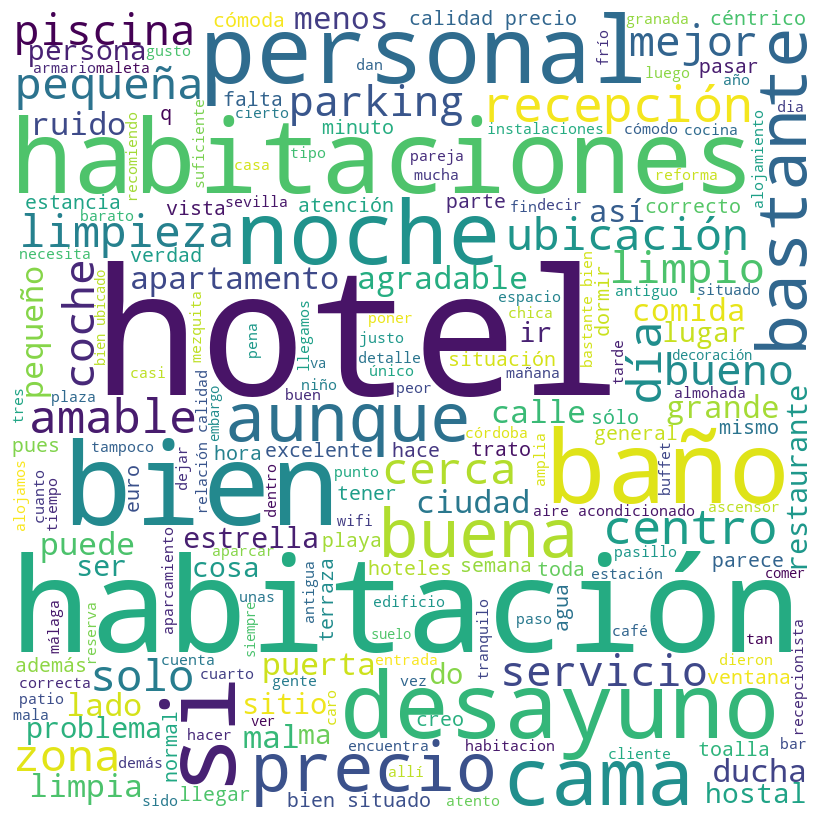

In [ ]:
stop_words = stopwords.words('spanish')

for i in train['label'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['label']==i,'review_text'], stopwords=stop_words)

## 4. Preparación de los datos

In [ ]:
X_train, y_train_feelings, y_train_rating = train['review_text'], train['label'], train['rating']
print(X_train)
print(y_train_feelings)
print(y_train_rating)

7415     No me gustó nada la experiencia. Ya que fue un...
6472     Hotel muy recomendable en relación calidad-pre...
17502    Hemos pasado tres noches en este hotel de Mala...
87       Es un hotel super bonito, con habitaciones sup...
14559    Los espacios comunes son amplios y transmiten ...
                               ...                        
15682    Muy buen lugar rural. Si quieres descansar y o...
13922    Mi novio y yo acabamos de regresar de una sema...
13375    Fuimos con mi familia en la noche, que era pre...
12605    Está muy bien localizado en el centro de Almer...
2784     * Cama extra cómoda (para dos de nosotros era ...
Name: review_text, Length: 14537, dtype: object
7415     0
6472     1
17502    1
87       1
14559    1
        ..
15682    1
13922    1
13375    1
12605    1
2784     1
Name: label, Length: 14537, dtype: int64
7415     1
6472     4
17502    4
87       5
14559    5
        ..
15682    5
13922    5
13375    5
12605    4
2784     5
Name: rating, Length

Al analizar las nubes de palabras proporcionadas, es posible observar que ciertos términos se repiten frecuentemente en las reseñas de los clientes. Estos términos repetidos pueden ser indicativos de aspectos que son muy comunes en las experiencias de los huéspedes, tanto positivos como negativos. Por ejemplo, palabras como "amable", "limpio" y "cómodo" sugieren aspectos que son valorados positivamente, mientras que palabras como "ruido", "sucio" o "pequeño" pueden indicar áreas problemáticas.

El uso de un diccionario de stopwords personalizado en el análisis de texto es una técnica común para filtrar palabras que son muy comunes o no proporcionan información valiosa para el análisis específico en cuestión. En este caso, términos como "hotel" o "habitación" son tan generales que se esperarían en casi cualquier reseña de hotel y no diferencian las opiniones de una manera que sea útil para el análisis de sentimientos o para identificar áreas de mejora específicas.

El razonamiento para incluir cada término en el diccionario de stopwords es para asegurarse de que el análisis se centre en palabras que realmente diferencian las reseñas y proporcionan una comprensión más profunda de la experiencia del cliente. Por ejemplo:



*   Términos generales como "cama" o "baño" son esperados en cualquier reseña de hotel y rara vez aportan información sobre la calidad a menos que estén acompañados de adjetivos.
*   Términos operativos como "reserva", "entrada" y "salida" son parte del proceso estándar de estadía en un hotel y no suelen indicar calidad o satisfacción a menos que se mencionen en un contexto negativo.
*   Términos descriptivos sin adjetivos como "personal", "servicio", y "limpieza" son demasiado vagos y necesitan ser calificados para proporcionar insights.


Al eliminar estas stopwords, el análisis puede centrarse en términos más descriptivos y específicos que realmente proporcionan información sobre las experiencias individuales de los huéspedes. Esto puede revelar tendencias y patrones más significativos en los datos, permitiendo a la cadena hotelera tomar acciones más informadas y específicas para mejorar sus servicios y la satisfacción del cliente.

In [ ]:
custom_stopwords = {
    'hotel': 'Un término muy general que se espera en todas las reseñas.',
    'habitacion': 'Demasiado común en las reseñas de hoteles, no distingue calidad o experiencia.',
    'cama': 'A menos que esté calificada (por ej., "incómoda"), es un término esperado.',
    'banio': 'Al igual que "cama", es un término muy general.',
    'personal': 'Sin adjetivos, no ofrece insights significativos.',
    'servicio': 'Necesita calificativos para ser útil.',
    'limpieza': 'Esperada en todas las reseñas, los adjetivos son más útiles.',
    'desayuno': 'Término general; los detalles son más relevantes.',
    'recepcion': 'Generalmente no es distintivo a menos que tenga adjetivos específicos.',
    'reserva': 'Parte estándar del proceso, no indica calidad o experiencia.',
    'ciudad': 'Demasiado genérico, no informa sobre el hotel específicamente.',
    'noche': 'Término de tiempo, no aporta a la evaluación del hotel.',
    'dia': 'Al igual que "noche", es un término temporal.',
    'precio': 'Sin contexto, no aporta valor al análisis.',
    'estancia': 'Término general de la duración de la estadía, necesita más contexto.',
    'zona': 'Demasiado amplio, las especificaciones de la zona podrían ser más útiles.',
    'centro': 'Puede ser útil para la ubicación pero no para la calidad del hotel.',
    'parking': 'A menos que esté calificado, no es particularmente distintivo.',
    'piscina': 'Común en hoteles, no distingue sin adjetivos.',
    'bano': 'Variante de "baño", igualmente general.',
    'entrada': 'Parte del proceso de llegada, generalmente no distintivo.',
    'salida': 'Contraparte de "entrada", similar en su falta de distinción.',
    'ruido': 'Podría ser útil si se especifica el nivel o la fuente del ruido.',
    'calle': 'General, a menos que se hable de una característica específica de la misma.',
    'terraza': 'Común en hoteles, necesita adjetivos para ser informativa.',
    'vista': 'Sin calificativos, no ofrece mucha información.'
}

In [ ]:
def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

def replace_numbers(words):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    #p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words

def remove_stopwords(words, stopwords=stopwords.words('spanish')):
    """Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stopwords:
            new_words.append(word)
    return new_words

# New method -------------------------------------------------------------------

def remove_custom_stopwords_regex(words, custom_stopwords):
    """Remove words based on custom regex patterns from list of tokenized words"""
    for stopword in custom_stopwords:
        # Crea una expresión regular que coincida con la palabra y su plural
        pattern = r'\b' + stopword + r'(es)?\b'
        words = [word for word in words if not re.search(pattern, word, re.IGNORECASE)]
    return words

# ------------------------------------------------------------------------------

def preproccesing(words):
    words = to_lowercase(words)
    #words = replace_numbers(words)
    words = remove_punctuation(words)
    words = remove_non_ascii(words)
    words = remove_stopwords(words)
    words = remove_custom_stopwords_regex(words, custom_stopwords)
    return words

In [ ]:
new_X_train = X_train.apply(word_tokenize)
new_X_train = new_X_train.apply(preproccesing)
new_X_train.head()

7415     [gusto, experiencia, sola, encuentro, funciona...
6472     [recomendable, relacion, calidadprecio, atento...
17502    [pasado, tres, noches, malaga, recomiendo, via...
87       [super, bonito, super, espaciosas, confortable...
14559    [espacios, comunes, amplios, transmiten, tranq...
Name: review_text, dtype: object

In [ ]:
train['trans_with_real_information'] = new_X_train.apply(lambda x: ' '.join(map(str, x)))
train.head()

,Unnamed: 0,title,rating,review_text,location,hotel,label,trans_with_real_information
7415,7415,Una noche y no repetiría.,1,No me gustó nada la experiencia. Ya que fue un...,Granada_Province_of_Granada_Andalucia,Casa_Palacio_Pilar_del_Toro_Hotel,0,gusto experiencia sola encuentro funciona wifi...
6472,6472,Céntrico y cálido,4,Hotel muy recomendable en relación calidad-pre...,Granada_Province_of_Granada_Andalucia,Melia_Granada,1,recomendable relacion calidadprecio atento est...
17502,17502,Mi experiencia en este hotel,4,Hemos pasado tres noches en este hotel de Mala...,NaN,NaN,1,pasado tres noches malaga recomiendo viajeros ...
87,87,¡Excelente Hotel!,5,"Es un hotel super bonito, con habitaciones sup...",Seville_Province_of_Seville_Andalucia,Hotel_Posada_del_Lucero,1,super bonito super espaciosas confortables per...
14559,14559,Excelente !!!! REPETIREMOS !!!!,5,Los espacios comunes son amplios y transmiten ...,Almedinilla_Province_of_Cordoba_Andalucia,Hospederia_la_Era,1,espacios comunes amplios transmiten tranquilid...


### WordCloud sin palabras que no aportan información

---------- Words for class: 1 ----------


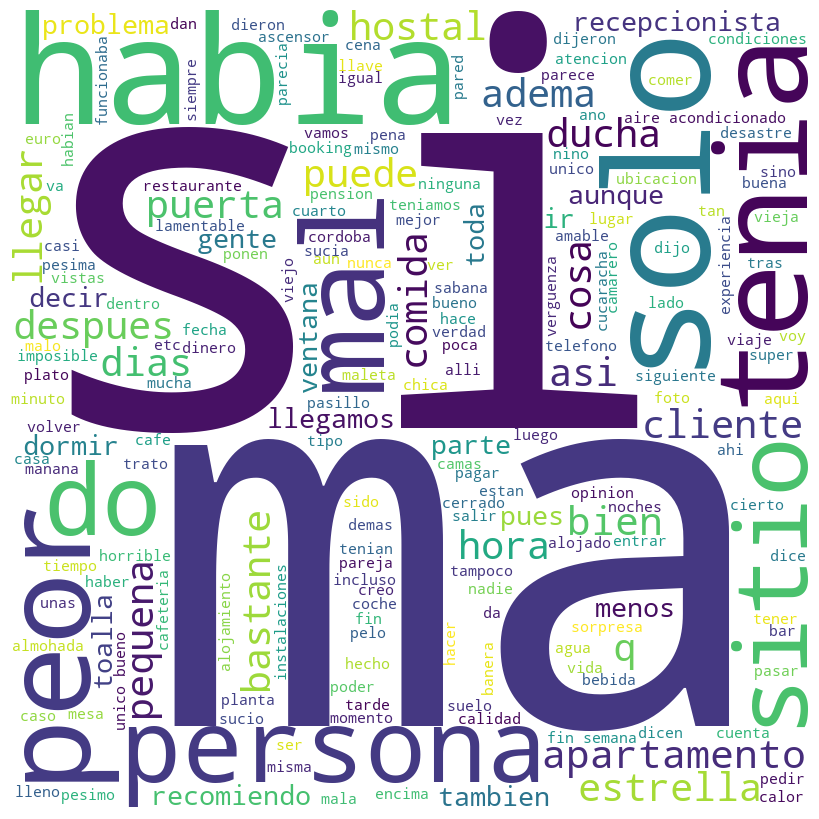

---------- Words for class: 4 ----------


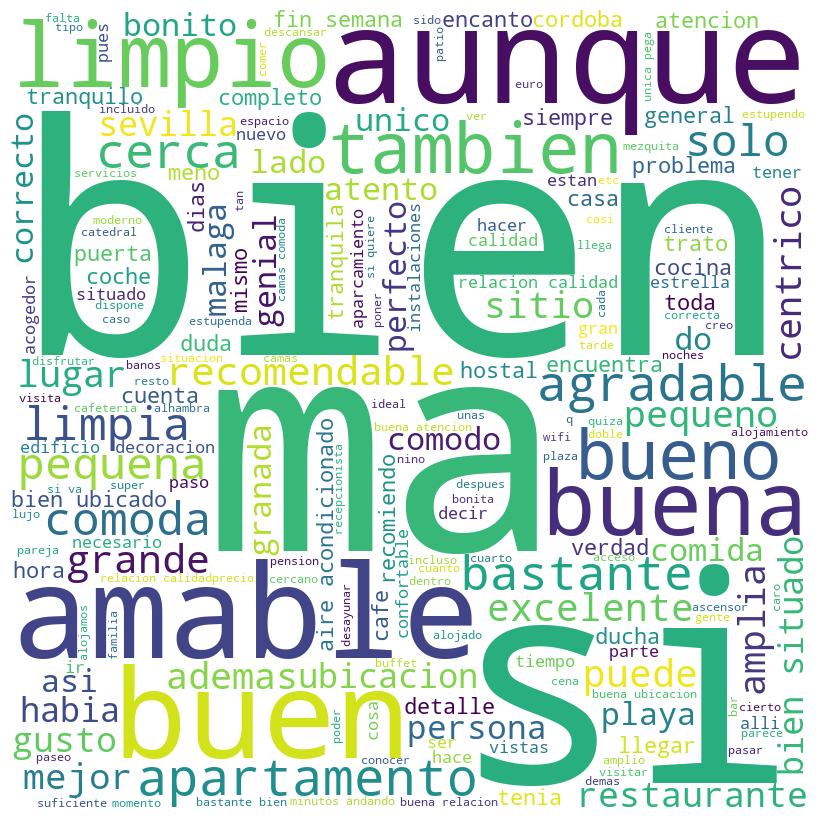

---------- Words for class: 5 ----------


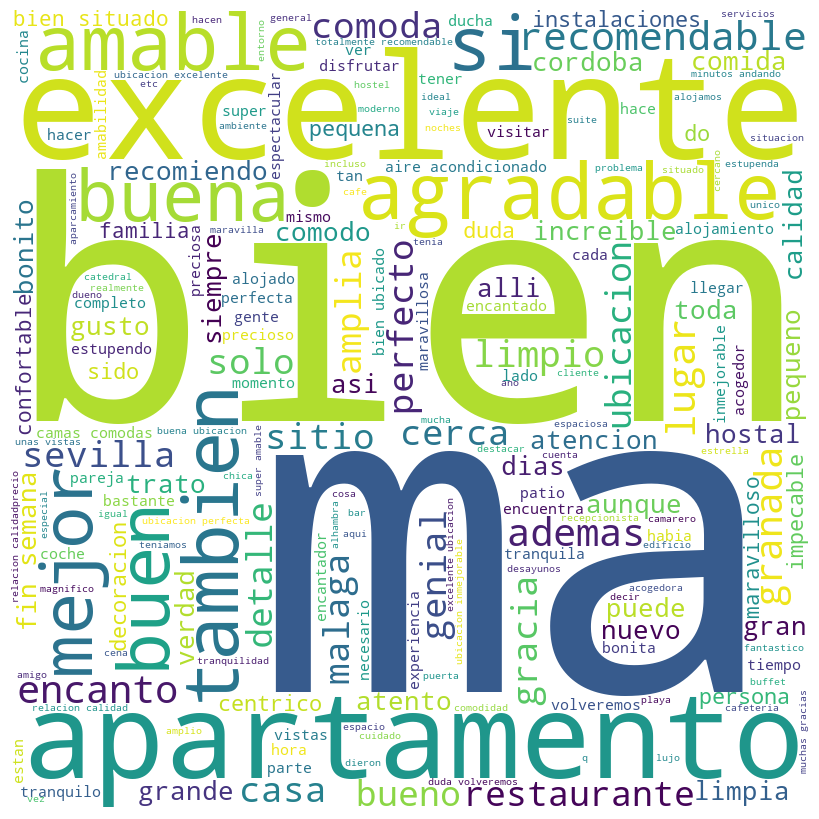

---------- Words for class: 3 ----------


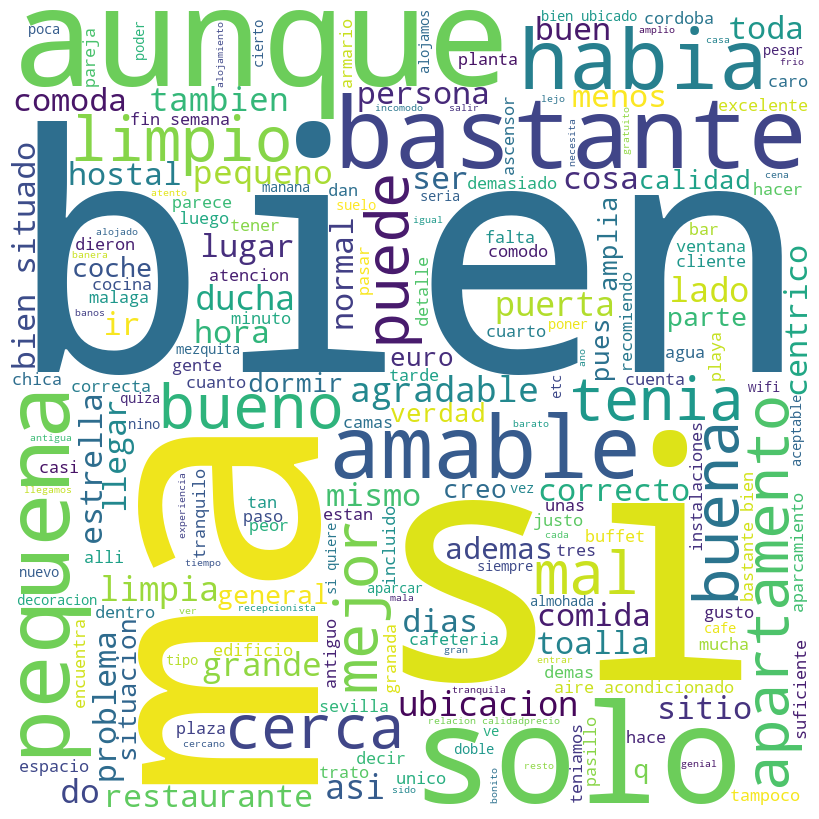

---------- Words for class: 2 ----------


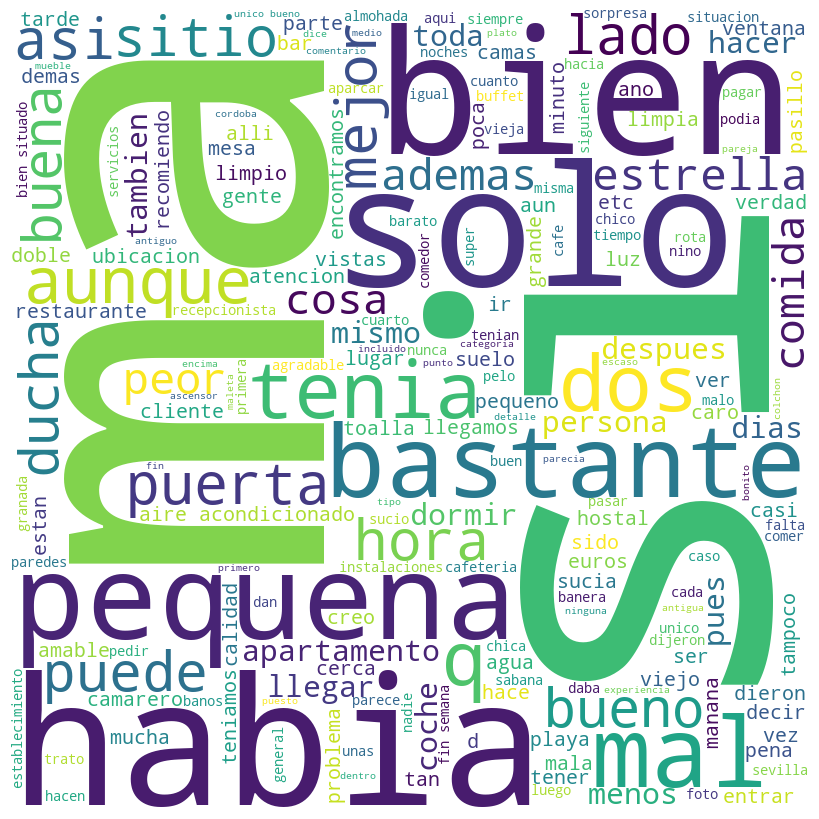

In [ ]:
stop_words = stopwords.words('spanish')

for i in train['rating'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['rating']==i,'trans_with_real_information'], stopwords=stop_words)

---------- Words for class: 0 ----------


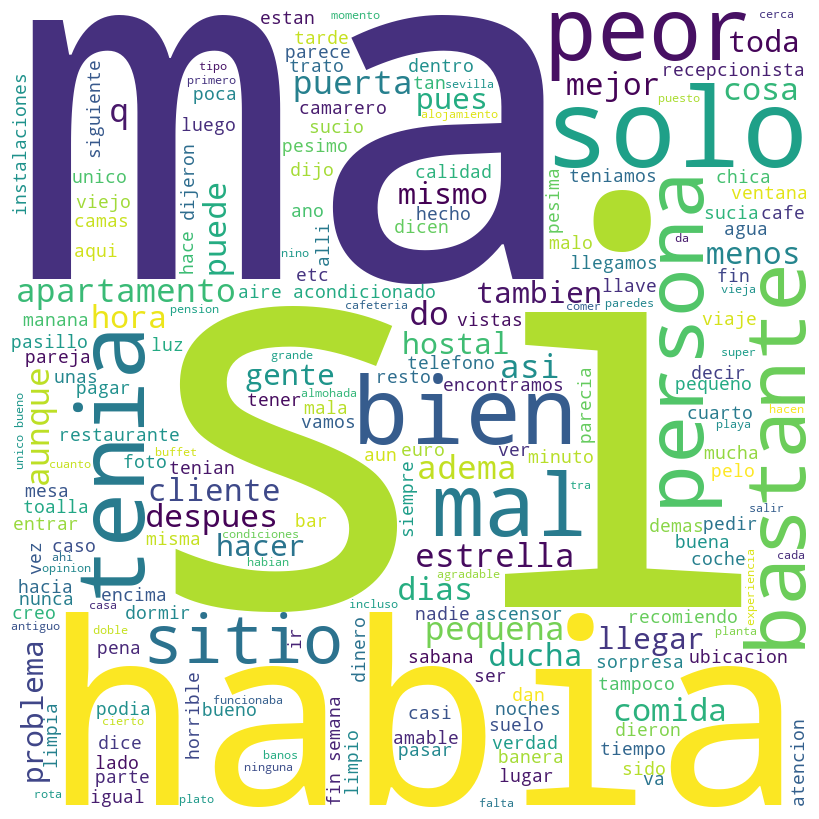

---------- Words for class: 1 ----------


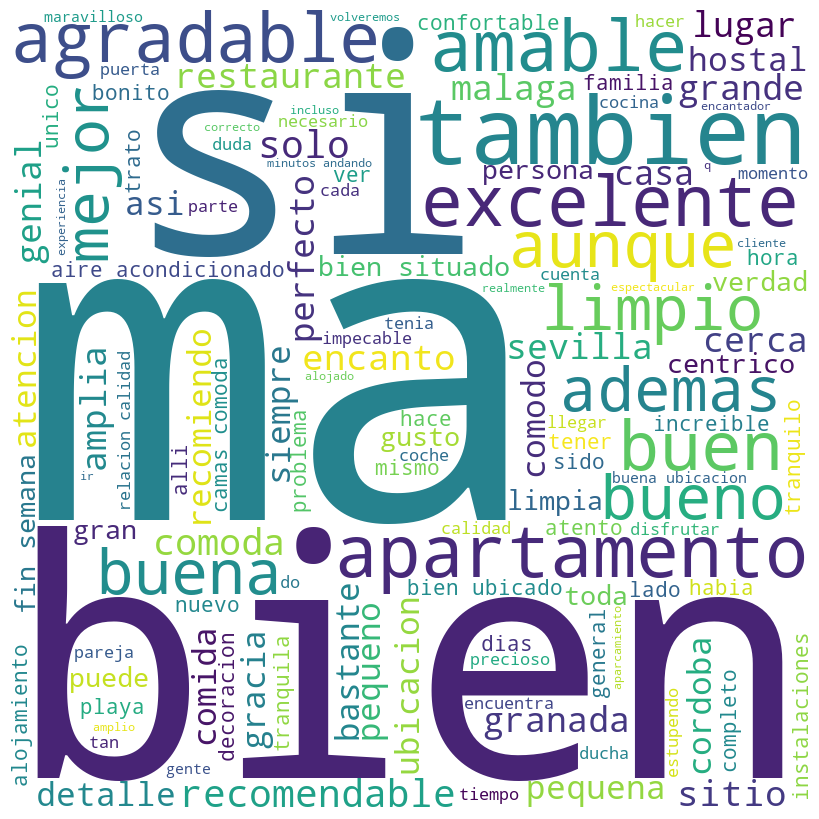

---------- Words for class: 3 ----------


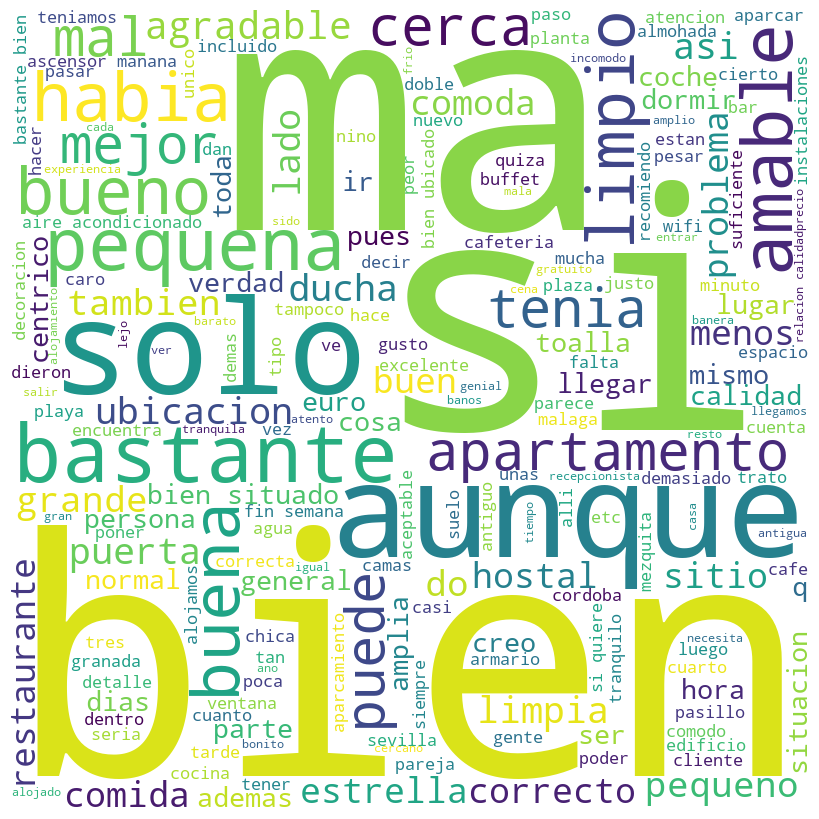

In [ ]:
stop_words = stopwords.words('spanish')

for i in train['label'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['label']==i,'trans_with_real_information'], stopwords=stop_words)

### Análisis de las palabras importantes

Las nubes de palabras reflejan las características más mencionadas en las reseñas de los clientes sobre su experiencia hotelera. En cada una de ellas, podemos observar términos que tienen mayor prominencia debido a su tamaño, lo que indica una mayor frecuencia de uso. Estos términos son cruciales para entender qué aspectos de los servicios hoteleros son más comentados por los huéspedes y, por tanto, pueden ser indicativos de puntos de excelencia o de áreas que requieren mejoras.

En un análisis de texto, como las reseñas de clientes, los términos más destacados en las nubes de palabras pueden agruparse en categorías que permitan a la cadena hotelera identificar áreas específicas de interés. Estas categorías podrían ser, por ejemplo:

*   Servicio: Palabras como "amable", "recomendable", "atención" destacan la importancia de la calidad del servicio prestado por el personal del hotel.
*   Ubicación: La frecuencia de palabras como "centro", "cerca", "ubicación" indica que la ubicación del hotel es un factor relevante para los huéspedes.
*   Alimentación: Palabras como "desayuno", "comida", "cena" indican que la oferta gastronómica del hotel es un punto de interés en las reseñas.

La presencia de estas palabras en las nubes sugiere su importancia en la percepción general del cliente y su experiencia en el hotel. Al comprender los términos más destacados, la cadena hotelera puede enfocarse en mantener y mejorar los aspectos positivamente resaltados, mientras que identifica y trabaja en las áreas negativas que requieren atención.

Respecto a las palabras comunes y generalizadas que se han excluido en el diccionario de stopwords, la intención es refinar el análisis para que las palabras restantes proporcionen una información más detallada y enfocada sobre las experiencias específicas de los clientes. Al filtrar estos términos, se puede prestar atención a los adjetivos y términos más descriptivos que ofrecen un valor agregado al análisis y pueden ser más accionables para la empresa.

### Aplicar transformaciones al texto

In [ ]:
def stem_words(words):
    """Stem words in list of tokenized words"""
    stemmer = SnowballStemmer('spanish')
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems

def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

def stem_and_lemmatize(words):
    words = stem_words(words)
    words = lemmatize_verbs(words)
    return words

In [ ]:
new_X_train = new_X_train.apply(stem_and_lemmatize)
new_X_train.head()

7415     [gust, experient, sol, encuentr, funcion, wifi...
6472     [recomend, relacion, calidadpreci, atent, esta...
17502    [pas, tres, noch, malag, recom, viajer, quier,...
87       [sup, bonit, sup, espaci, confort, person, tra...
14559    [espaci, comun, ampli, transmit, tranquil, sor...
Name: review_text, dtype: object

In [ ]:
train['trans'] = new_X_train.apply(lambda x: ' '.join(map(str, x)))
train.head()

,Unnamed: 0,title,rating,review_text,location,hotel,label,trans_with_real_information,trans
7415,7415,Una noche y no repetiría.,1,No me gustó nada la experiencia. Ya que fue un...,Granada_Province_of_Granada_Andalucia,Casa_Palacio_Pilar_del_Toro_Hotel,0,gusto experiencia sola encuentro funciona wifi...,gust experient sol encuentr funcion wifi telev...
6472,6472,Céntrico y cálido,4,Hotel muy recomendable en relación calidad-pre...,Granada_Province_of_Granada_Andalucia,Melia_Granada,1,recomendable relacion calidadprecio atento est...,recomend relacion calidadpreci atent estand co...
17502,17502,Mi experiencia en este hotel,4,Hemos pasado tres noches en este hotel de Mala...,NaN,NaN,1,pasado tres noches malaga recomiendo viajeros ...,pas tres noch malag recom viajer quier siti bi...
87,87,¡Excelente Hotel!,5,"Es un hotel super bonito, con habitaciones sup...",Seville_Province_of_Seville_Andalucia,Hotel_Posada_del_Lucero,1,super bonito super espaciosas confortables per...,sup bonit sup espaci confort person trabaj ama...
14559,14559,Excelente !!!! REPETIREMOS !!!!,5,Los espacios comunes son amplios y transmiten ...,Almedinilla_Province_of_Cordoba_Andalucia,Hospederia_la_Era,1,espacios comunes amplios transmiten tranquilid...,espaci comun ampli transmit tranquil sorprendi...


In [ ]:
dummy = CountVectorizer(binary=True)
X_dummy = dummy.fit_transform(train['trans'])
print(X_dummy.shape)
X_dummy[0]

(14537, 17131)


<1x17131 sparse matrix of type '<class 'numpy.int64'>'
	with 25 stored elements in Compressed Sparse Row format>

In [ ]:
count = CountVectorizer()
X_count = count.fit_transform(train['trans'])
print(X_count.shape)

(14537, 17131)


In [ ]:
tf_idf = TfidfVectorizer()
X_tf_idf = tf_idf.fit_transform(train['trans'])
print(X_tf_idf.shape)

(14537, 17131)


## 5. Modelado

In [ ]:
class TextPreprocessing(BaseEstimator,TransformerMixin):
    def __init__(self,stopwords=stopwords.words('spanish')):
        self.stopwords = stopwords

    def remove_non_ascii(self, words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words

    def to_lowercase(self, words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words

    def remove_punctuation(self, words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words

    def replace_numbers(self, words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        #p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words

    def remove_stopwords(self, words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in self.stopwords:
                new_words.append(word)
        return new_words

    def stem_words(self, words):
        """Stem words in list of tokenized words"""
        stemmer = SnowballStemmer('spanish')
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems

    def lemmatize_verbs(self, words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas

    def stem_and_lemmatize(self, words):
        words = self.stem_words(words)
        words = self.lemmatize_verbs(words)
        return words

    def preproccesing(self, words):
        words = self.to_lowercase(words)
        #words = self.replace_numbers(words)
        words = self.remove_punctuation(words)
        words = self.remove_non_ascii(words)
        words = self.remove_stopwords(words)
        return words

    def fit(self,X,y=None):
        return self

    def transform(self,X,y=None):
        new_X_train = pd.Series(X)
        new_X_train = new_X_train.apply(contractions.fix)
        new_X_train = new_X_train.apply(word_tokenize)
        new_X_train = new_X_train.apply(lambda x: self.preproccesing(x))
        new_X_train = new_X_train.apply(lambda x: self.stem_and_lemmatize(x))
        new_X_train = new_X_train.apply(lambda x: ' '.join(map(str, x)))
        return new_X_train

In [ ]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues,size=(10,10)):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')



    fig, ax = plt.subplots(figsize=size)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

### Naive Bayes

El algoritmo Naive Bayes es una técnica de clasificación basada en el teorema de Bayes con la suposición "naive" de independencia entre cada par de características. A pesar de su simplicidad, Naive Bayes ha mostrado ser efectivo en tareas de clasificación de documentos y análisis de sentimientos. Algunas de las características por las que se pensaría utilizar es:


*   Simplicidad y Facilidad de Implementación: El modelo es relativamente sencillo de entender e implementar, lo que lo hace accesible incluso para aquellos que no son expertos en el campo del aprendizaje automático.
*   Buen Rendimiento con Datos Textuales: Naive Bayes ha demostrado ser especialmente eficaz para la clasificación de texto debido a su capacidad para manejar miles de características textuales que surgen en el procesamiento del lenguaje natural (NLP).
*   Probabilidades de Clase: Naive Bayes no solo clasifica los textos, sino que también proporciona las probabilidades de pertenencia a cada clase, lo cual puede ser una información valiosa para determinar la confianza del modelo en sus predicciones.



In [ ]:
estimatorsNB = [
        ('preproccess',TextPreprocessing()),
        ('transform',CountVectorizer(lowercase=False)),
        ('classifier', MultinomialNB())
    ]

In [ ]:
parametersNB = {
              'transform':[CountVectorizer(binary=True,lowercase=False),CountVectorizer(lowercase=False),TfidfVectorizer(lowercase=False)],
              'classifier__alpha': [0.01, 0.1, 1.0],
              'classifier__fit_prior': [True, False],
              }

#### Naive Bayes Label Feelings

In [ ]:
%%time
pipe_NB_feelings = Pipeline(estimatorsNB)

pipe_NB_feelings.fit(X_train, y_train_feelings)

CPU times: total: 28.2 s
Wall time: 28.2 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', MultinomialNB())])

In [ ]:
y_pred_train_feelings_NB = pipe_NB_feelings.predict(X_train)
y_pred_train_feelings_NB

array([0, 1, 1, ..., 1, 1, 1], dtype=int64)

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión Sentimientos'}, xlabel='Predicted label', ylabel='True label'>

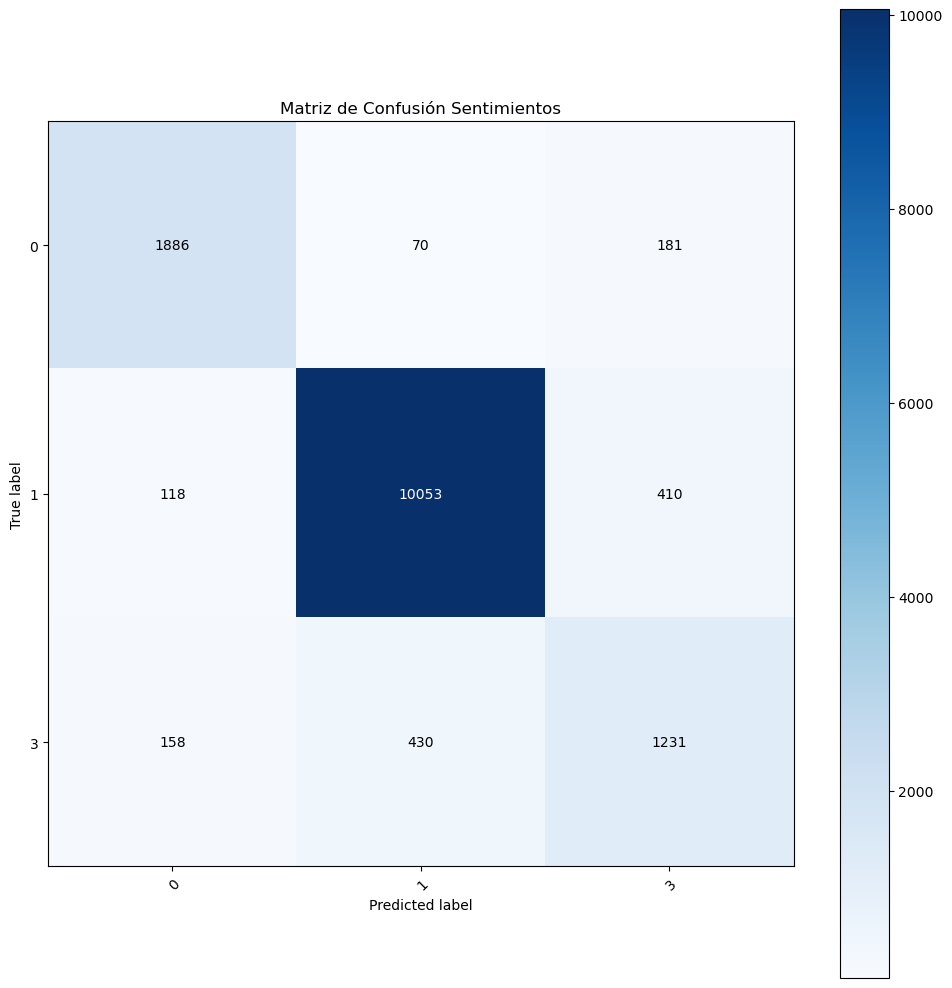

In [ ]:
%matplotlib inline

classes_feelings_NB = pipe_NB_feelings['classifier'].classes_

plot_confusion_matrix(y_true=y_train_feelings, y_pred=y_pred_train_feelings_NB, classes=classes_feelings_NB,
                      title='Matriz de Confusión Sentimientos')

In [ ]:
report_NB_feelings = classification_report(y_train_feelings, y_pred_train_feelings_NB)

print("Train Report for Naive Bayes\n", report_NB_feelings)

Train Report for Naive Bayes
               precision    recall  f1-score   support

           0       0.87      0.88      0.88      2137
           1       0.95      0.95      0.95     10581
           3       0.68      0.68      0.68      1819

    accuracy                           0.91     14537
   macro avg       0.83      0.84      0.83     14537
weighted avg       0.91      0.91      0.91     14537



In [ ]:
%%time
grid_search_feelings_NB = GridSearchCV(pipe_NB_feelings, parametersNB, scoring='precision_macro', cv=3, n_jobs=-1, error_score=0.0)

grid_search_feelings_NB.fit(X_train, y_train_feelings)

CPU times: total: 29.9 s
Wall time: 3min 52s


GridSearchCV(cv=3, error_score=0.0,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        CountVectorizer(lowercase=False)),
                                       ('classifier', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'classifier__alpha': [0.01, 0.1, 1.0],
                         'classifier__fit_prior': [True, False],
                         'transform': [CountVectorizer(binary=True,
                                                       lowercase=False),
                                       CountVectorizer(lowercase=False),
                                       TfidfVectorizer(lowercase=False)]},
             scoring='precision_macro')

#### Naive Bayes Rating

In [ ]:
%%time
pipe_NB_rating = Pipeline(estimatorsNB)

pipe_NB_rating.fit(X_train, y_train_rating)

CPU times: total: 28.6 s
Wall time: 28.4 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', MultinomialNB())])

In [ ]:
y_pred_train_rating_NB = pipe_NB_rating.predict(X_train)
y_pred_train_rating_NB

array([1, 4, 4, ..., 5, 4, 4], dtype=int64)

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión Rating'}, xlabel='Predicted label', ylabel='True label'>

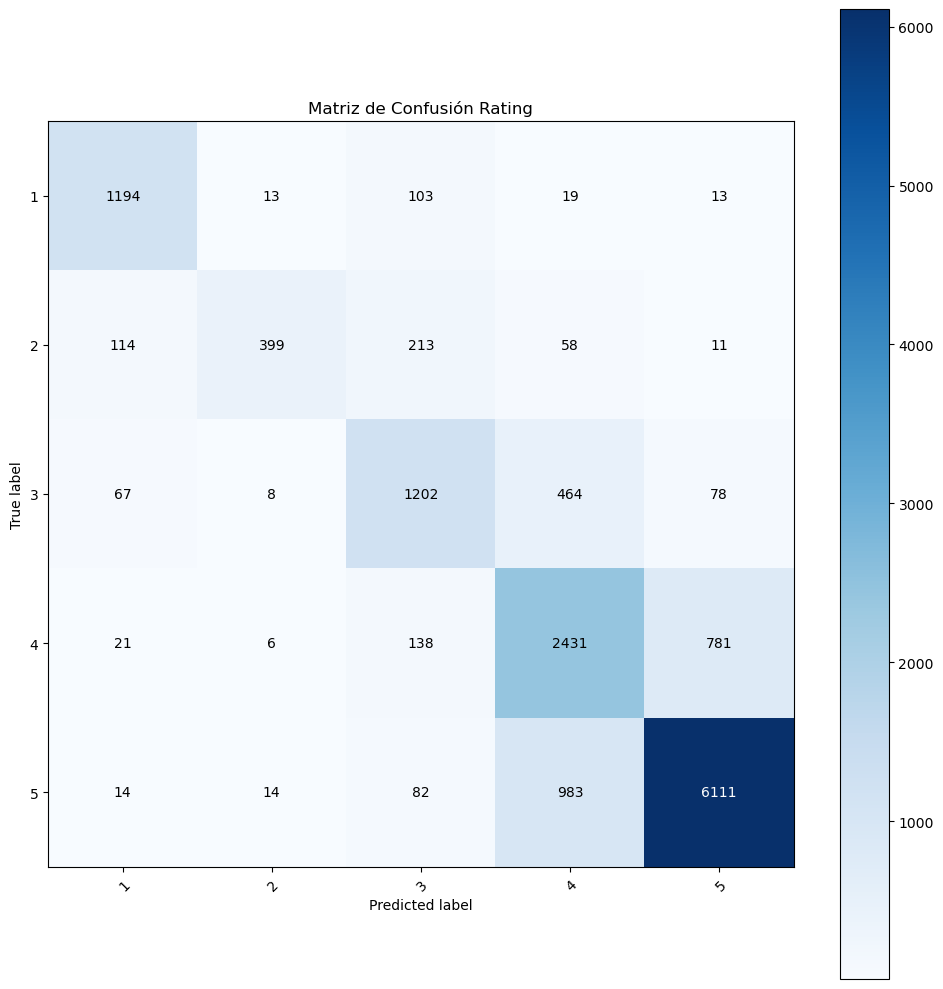

In [ ]:
%matplotlib inline

classes_rating_NB = pipe_NB_rating['classifier'].classes_

plot_confusion_matrix(y_true=y_train_rating, y_pred=y_pred_train_rating_NB, classes=classes_rating_NB,
                      title='Matriz de Confusión Rating')

In [ ]:
report_NB_rating = classification_report(y_train_rating, y_pred_train_rating_NB)

print("Train Report for Naive Bayes\n", report_NB_rating)

Train Report for Naive Bayes
               precision    recall  f1-score   support

           1       0.85      0.89      0.87      1342
           2       0.91      0.50      0.65       795
           3       0.69      0.66      0.68      1819
           4       0.61      0.72      0.66      3377
           5       0.87      0.85      0.86      7204

    accuracy                           0.78     14537
   macro avg       0.79      0.72      0.74     14537
weighted avg       0.79      0.78      0.78     14537



In [ ]:
%%time
grid_search_rating_NB = GridSearchCV(pipe_NB_rating, parametersNB, scoring='precision_macro', cv=3, n_jobs=-1, error_score=0.0)

grid_search_rating_NB.fit(X_train, y_train_rating)

CPU times: total: 29.7 s
Wall time: 3min 46s


GridSearchCV(cv=3, error_score=0.0,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        CountVectorizer(lowercase=False)),
                                       ('classifier', MultinomialNB())]),
             n_jobs=-1,
             param_grid={'classifier__alpha': [0.01, 0.1, 1.0],
                         'classifier__fit_prior': [True, False],
                         'transform': [CountVectorizer(binary=True,
                                                       lowercase=False),
                                       CountVectorizer(lowercase=False),
                                       TfidfVectorizer(lowercase=False)]},
             scoring='precision_macro')

### KNN


El uso del algoritmo K-Nearest Neighbors (KNN) en el contexto del análisis de reseñas de una cadena hotelera en Andalucía puede aportar varios beneficios específicos, especialmente en el ámbito de la clasificación de sentimientos y opiniones. Aquí te explico algunos de estos beneficios:


*   No necesita suposiciones previas sobre los datos: A diferencia de otros algoritmos, KNN no hace suposiciones sobre la distribución subyacente de los datos. Esto puede ser ventajoso si las opiniones de los usuarios tienen distribuciones complejas que son difíciles de modelar con otros algoritmos.
*   Actualización dinámica: KNN es un algoritmo de aprendizaje 'perezoso', es decir, no construye un modelo interno sino que utiliza la totalidad de los datos para realizar la clasificación. Esto permite que el sistema actualice fácilmente su clasificación a medida que se reciben nuevas opiniones, sin necesidad de reentrenar un modelo completo.
*   Eficacia en conjuntos de datos de tamaño moderado: Si bien KNN puede no ser el algoritmo más eficiente para conjuntos de datos extremadamente grandes debido a su necesidad de calcular distancias para cada nueva instancia, en conjuntos de datos de tamaño moderado puede ser muy efectivo y proporcionar una buena precisión.

En el contexto del análisis de sentimientos para esta cadena hotelera, KNN podría identificar agrupaciones naturales de opiniones positivas, neutras y negativas y clasificar nuevas opiniones basándose en el parecido con estas agrupaciones. Sin embargo, su eficacia depende de la calidad de las características (palabras o frases) utilizadas para definir la similitud entre las reseñas. Por lo tanto, es crucial realizar una buena selección de características y quizás aplicar técnicas de reducción de dimensionalidad antes de emplear KNN en datos de texto.

In [ ]:
estimatorsKNN = [
    ('preproccess', TextPreprocessing()),
    ('transform', CountVectorizer(lowercase=False)),
    ('classifier', KNeighborsClassifier())
]

In [ ]:
parametersKNN = {
    'transform': [CountVectorizer(binary=True, lowercase=False), CountVectorizer(lowercase=False), TfidfVectorizer(lowercase=False)],
    'classifier__n_neighbors': [3, 5, 7],
    'classifier__weights': ['uniform', 'distance'],
    'classifier__algorithm': ['ball_tree', 'kd_tree', 'brute', 'auto']
}

#### KNN Label Feelings

In [ ]:
%%time
pipe_KNN_feelings = Pipeline(estimatorsKNN)

pipe_KNN_feelings.fit(X_train, y_train_feelings)

CPU times: total: 28.2 s
Wall time: 28.3 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', KNeighborsClassifier())])

In [ ]:
y_pred_train_feelings_KNN = pipe_KNN_feelings.predict(X_train)
y_pred_train_feelings_KNN

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión Sentimientos'}, xlabel='Predicted label', ylabel='True label'>

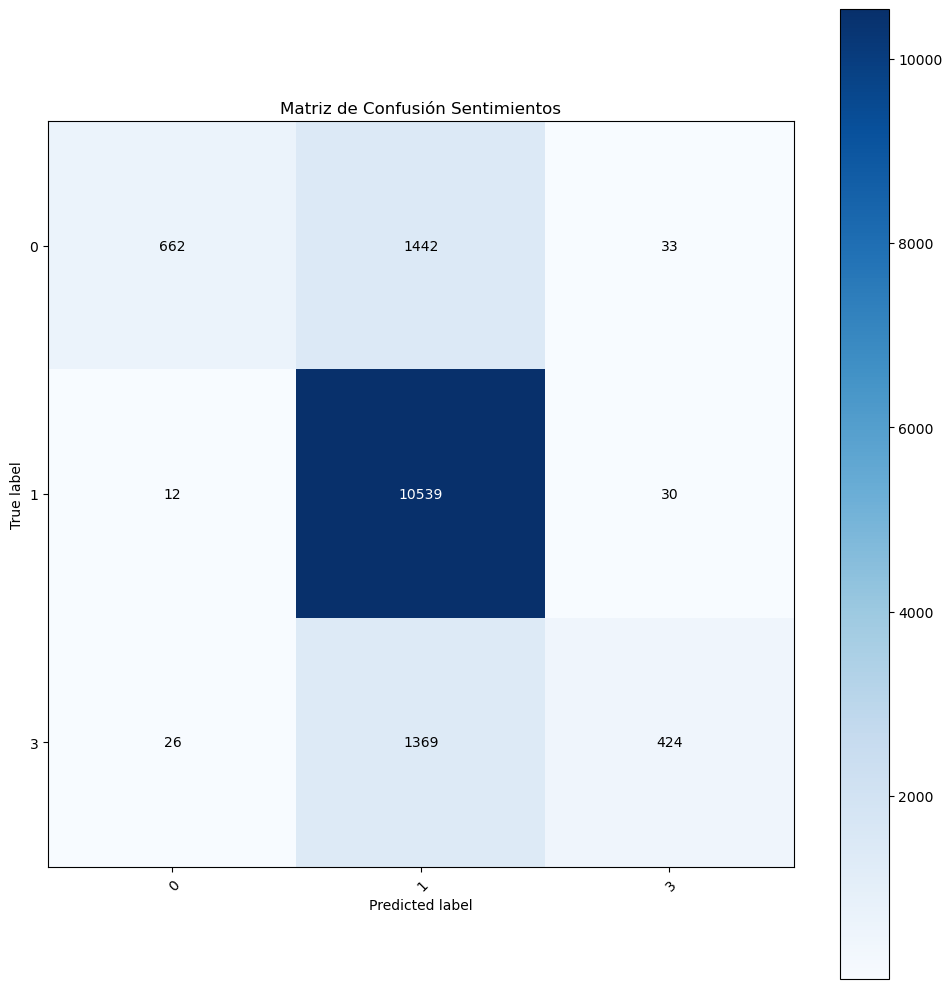

In [ ]:
%matplotlib inline

classes_feelings_KNN = pipe_KNN_feelings['classifier'].classes_

plot_confusion_matrix(y_true=y_train_feelings, y_pred=y_pred_train_feelings_KNN, classes=classes_feelings_KNN,
                      title='Matriz de Confusión Sentimientos')

In [ ]:
report_KNN_feelings = classification_report(y_train_feelings, y_pred_train_feelings_KNN)

print("Train Report for K Nearest Neighborhood\n", report_KNN_feelings)

Train Report for K Nearest Neighborhood
               precision    recall  f1-score   support

           0       0.95      0.31      0.47      2137
           1       0.79      1.00      0.88     10581
           3       0.87      0.23      0.37      1819

    accuracy                           0.80     14537
   macro avg       0.87      0.51      0.57     14537
weighted avg       0.82      0.80      0.76     14537



In [ ]:
%%time
grid_search_feelings_KNN = GridSearchCV(pipe_KNN_feelings, parametersKNN, scoring='precision_macro', cv=3, n_jobs=-1, error_score=0.0)

grid_search_feelings_KNN.fit(X_train, y_train_feelings)

CPU times: total: 33.7 s
Wall time: 17min 33s


C:\Users\USER\anaconda3.0\Lib\site-packages\sklearn\neighbors\_base.py:564: UserWarning: cannot use tree with sparse input: using brute force
  warnings.warn("cannot use tree with sparse input: using brute force")


GridSearchCV(cv=3, error_score=0.0,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        CountVectorizer(lowercase=False)),
                                       ('classifier', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'classifier__algorithm': ['ball_tree', 'kd_tree',
                                                   'brute', 'auto'],
                         'classifier__n_neighbors': [3, 5, 7],
                         'classifier__weights': ['uniform', 'distance'],
                         'transform': [CountVectorizer(binary=True,
                                                       lowercase=False),
                                       CountVectorizer(lowercase=False),
                                       TfidfVectorizer(lowercase=False)]},
             scoring='precision_macro')

#### KNN Rating

In [ ]:
%%time
pipe_KNN_rating = Pipeline(estimatorsKNN)

pipe_KNN_rating.fit(X_train, y_train_rating)

CPU times: total: 28.7 s
Wall time: 28.5 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', KNeighborsClassifier())])

In [ ]:
y_pred_train_rating_KNN = pipe_KNN_rating.predict(X_train)
y_pred_train_rating_KNN

array([1, 5, 5, ..., 4, 4, 5], dtype=int64)

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión Rating'}, xlabel='Predicted label', ylabel='True label'>

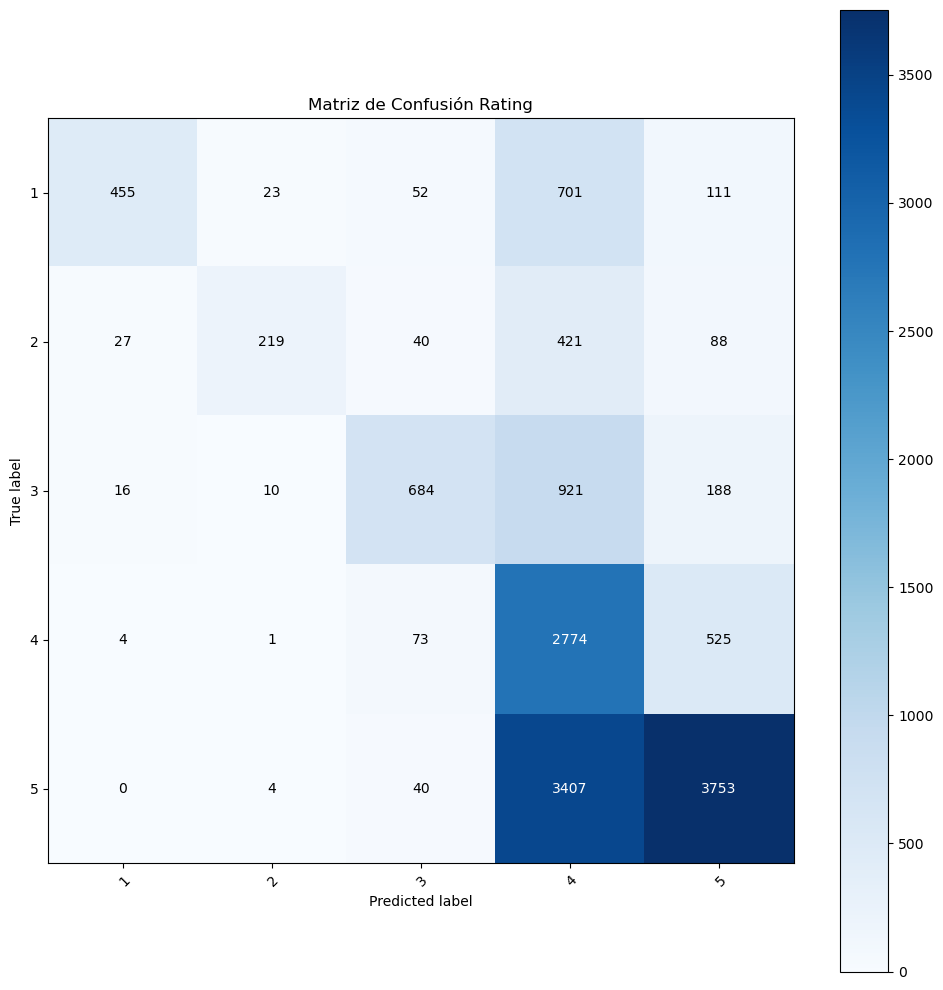

In [ ]:
%matplotlib inline

classes_rating_KNN = pipe_KNN_rating['classifier'].classes_

plot_confusion_matrix(y_true=y_train_rating, y_pred=y_pred_train_rating_KNN, classes=classes_rating_KNN,
                      title='Matriz de Confusión Rating')

In [ ]:
report_KNN_rating = classification_report(y_train_rating, y_pred_train_rating_KNN)

print("Train Report for K Nearest Neighborhood\n", report_KNN_rating)

Train Report for K Nearest Neighborhood
               precision    recall  f1-score   support

           1       0.91      0.34      0.49      1342
           2       0.85      0.28      0.42       795
           3       0.77      0.38      0.51      1819
           4       0.34      0.82      0.48      3377
           5       0.80      0.52      0.63      7204

    accuracy                           0.54     14537
   macro avg       0.73      0.47      0.51     14537
weighted avg       0.70      0.54      0.56     14537



In [ ]:
%%time
grid_search_rating_KNN = GridSearchCV(pipe_KNN_rating, parametersKNN, scoring='precision_macro', cv=3, n_jobs=-1, error_score=0.0)

grid_search_rating_KNN.fit(X_train, y_train_rating)

CPU times: total: 33.2 s
Wall time: 17min 32s


C:\Users\USER\anaconda3.0\Lib\site-packages\sklearn\neighbors\_base.py:564: UserWarning: cannot use tree with sparse input: using brute force
  warnings.warn("cannot use tree with sparse input: using brute force")


GridSearchCV(cv=3, error_score=0.0,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        CountVectorizer(lowercase=False)),
                                       ('classifier', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'classifier__algorithm': ['ball_tree', 'kd_tree',
                                                   'brute', 'auto'],
                         'classifier__n_neighbors': [3, 5, 7],
                         'classifier__weights': ['uniform', 'distance'],
                         'transform': [CountVectorizer(binary=True,
                                                       lowercase=False),
                                       CountVectorizer(lowercase=False),
                                       TfidfVectorizer(lowercase=False)]},
             scoring='precision_macro')

## 6. Producción

### Feelings

In [ ]:
best_model_NB_feelings = grid_search_feelings_NB.best_estimator_

y_pred_train_NB_BM_feelings = best_model_NB_feelings.predict(X_train)
report_NB_BM_feelings = classification_report(y_train_feelings, y_pred_train_NB_BM_feelings)

print("Train Report best model Naive Bayes for feelings\n", report_NB_BM_feelings)

y_pred_test_NB_GS_feelings = best_model_NB_feelings.predict(test['review_text'])
report_NB_GS_feelings = classification_report(test['label'], y_pred_test_NB_GS_feelings)

print("Test Report best model Naive Bayes for feelings\n", report_NB_GS_feelings)

Train Report best model Naive Bayes for feelings
               precision    recall  f1-score   support

           0       0.93      0.90      0.91      2137
           1       0.92      0.99      0.96     10581
           3       0.93      0.57      0.70      1819

    accuracy                           0.93     14537
   macro avg       0.93      0.82      0.86     14537
weighted avg       0.93      0.93      0.92     14537

Test Report best model Naive Bayes for feelings
               precision    recall  f1-score   support

           0       0.87      0.81      0.84       534
           1       0.88      0.99      0.93      2646
           3       0.71      0.27      0.39       455

    accuracy                           0.87      3635
   macro avg       0.82      0.69      0.72      3635
weighted avg       0.86      0.87      0.85      3635



In [ ]:
best_model_KNN_feelings = grid_search_feelings_KNN.best_estimator_

y_pred_train_KNN_BM_feelings = best_model_KNN_feelings.predict(X_train)
report_KNN_BM_feelings = classification_report(y_train_feelings, y_pred_train_KNN_BM_feelings)

print("Train Report best model K Nearest Neighborhoods for feelings\n", report_KNN_BM_feelings)

y_pred_test_KNN_GS_feelings = best_model_KNN_feelings.predict(test['review_text'])
report_KNN_GS_feelings = classification_report(test['label'], y_pred_test_KNN_GS_feelings)

print("Test Report best model K Nearest Neighborhoods for feelings\n", report_KNN_GS_feelings)

Train Report best model K Nearest Neighborhoods for feelings
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2137
           1       1.00      1.00      1.00     10581
           3       1.00      1.00      1.00      1819

    accuracy                           1.00     14537
   macro avg       1.00      1.00      1.00     14537
weighted avg       1.00      1.00      1.00     14537

Test Report best model K Nearest Neighborhoods for feelings
               precision    recall  f1-score   support

           0       1.00      0.36      0.52       534
           1       0.80      1.00      0.89      2646
           3       0.97      0.31      0.47       455

    accuracy                           0.82      3635
   macro avg       0.92      0.56      0.63      3635
weighted avg       0.85      0.82      0.78      3635



### Rating

In [ ]:
best_model_NB_rating = grid_search_rating_NB.best_estimator_

y_pred_train_NB_BM_rating = best_model_NB_rating.predict(X_train)
report_NB_BM_rating = classification_report(y_train_rating, y_pred_train_NB_BM_rating, zero_division=1)

print("Train Report best model Naive Bayes for feelings\n", report_NB_BM_rating)

y_pred_test_NB_GS_rating = best_model_NB_rating.predict(test['review_text'])
report_NB_GS_rating = classification_report(test['rating'], y_pred_test_NB_GS_rating, zero_division=1)

print("Test Report best model Naive Bayes for feelings\n", report_NB_GS_rating)

Train Report best model Naive Bayes for feelings
               precision    recall  f1-score   support

           1       0.90      0.92      0.91      1342
           2       0.97      0.55      0.71       795
           3       0.85      0.70      0.77      1819
           4       0.77      0.68      0.72      3377
           5       0.84      0.96      0.90      7204

    accuracy                           0.84     14537
   macro avg       0.87      0.76      0.80     14537
weighted avg       0.84      0.84      0.83     14537

Test Report best model Naive Bayes for feelings
               precision    recall  f1-score   support

           1       0.76      0.77      0.76       335
           2       0.83      0.19      0.31       199
           3       0.53      0.39      0.45       455
           4       0.54      0.44      0.48       845
           5       0.75      0.92      0.83      1801

    accuracy                           0.69      3635
   macro avg       0.68      0.5

In [ ]:
best_model_KNN_rating = grid_search_rating_KNN.best_estimator_

y_pred_train_KNN_BM_rating = best_model_KNN_rating.predict(X_train)
report_KNN_BM_rating = classification_report(y_train_rating, y_pred_train_KNN_BM_rating)

print("Train Report best model K Nearest Neighborhoods for feelings\n", report_KNN_BM_rating)

y_pred_test_KNN_GS_rating = best_model_KNN_rating.predict(test['review_text'])
report_KNN_GS_rating = classification_report(test['rating'], y_pred_test_KNN_GS_rating)

print("Test Report best model K Nearest Neighborhoods for feelings\n", report_KNN_GS_rating)

Train Report best model K Nearest Neighborhoods for feelings
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1342
           2       1.00      1.00      1.00       795
           3       1.00      1.00      1.00      1819
           4       1.00      1.00      1.00      3377
           5       1.00      1.00      1.00      7204

    accuracy                           1.00     14537
   macro avg       1.00      1.00      1.00     14537
weighted avg       1.00      1.00      1.00     14537

Test Report best model K Nearest Neighborhoods for feelings
               precision    recall  f1-score   support

           1       1.00      0.35      0.51       335
           2       1.00      0.35      0.51       199
           3       1.00      0.31      0.47       455
           4       0.34      1.00      0.51       845
           5       1.00      0.47      0.64      1801

    accuracy                           0.56      3635
   macro

## 7. Prueba con modelo SVM

In [ ]:
estimatorsSVM = [
    ('preproccess', TextPreprocessing()),
    ('transform', TfidfVectorizer(lowercase=False)),
    ('classifier', SVC(kernel='linear'))
]

In [ ]:
parametersSVM = {
    'classifier__C': [0.1, 1, 10],
    'classifier__kernel': ['linear', 'rbf'],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__class_weight': ['balanced'],
}

In [ ]:
pipe_SVM_feelings = Pipeline(estimatorsSVM)
pipe_SVM_rating = Pipeline(estimatorsSVM)

#### SVM feelings

In [ ]:
%%time
grid_search_SVM_feelings = GridSearchCV(pipe_SVM_feelings, parametersSVM, scoring='precision_macro', cv=3, n_jobs=-1)

grid_search_SVM_feelings.fit(X_train, y_train_feelings)

CPU times: total: 1min 37s
Wall time: 7min 2s


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        TfidfVectorizer(lowercase=False)),
                                       ('classifier', SVC(kernel='linear'))]),
             n_jobs=-1,
             param_grid={'classifier__C': [0.1, 1, 10],
                         'classifier__class_weight': ['balanced'],
                         'classifier__gamma': ['scale', 'auto'],
                         'classifier__kernel': ['linear', 'rbf']},
             scoring='precision_macro')

In [ ]:
best_model_SVM_feelings = grid_search_SVM_feelings.best_estimator_

y_pred_train_SVM_feelings = best_model_SVM_feelings.predict(X_train)
y_pred_test_SVM_GS_feelings = best_model_SVM_feelings.predict(test['review_text'])
report_SVM_GS_feelings = classification_report(test['label'], y_pred_test_SVM_GS_feelings)

print("Test Report best model SVM for feelings\n", report_SVM_GS_feelings)

Test Report best model SVM for feelings
               precision    recall  f1-score   support

           0       0.88      0.85      0.86       534
           1       0.92      0.98      0.95      2646
           3       0.74      0.49      0.59       455

    accuracy                           0.90      3635
   macro avg       0.84      0.78      0.80      3635
weighted avg       0.89      0.90      0.89      3635



In [ ]:
classes_feelings_SVM = best_model_SVM_feelings['classifier'].classes_

#### SVM rating

In [ ]:
%%time
grid_search_SVM_rating = GridSearchCV(pipe_SVM_rating, parametersSVM, scoring='precision_macro', cv=3, n_jobs=-1)

grid_search_SVM_rating.fit(X_train, y_train_rating)

CPU times: total: 2min 9s
Wall time: 8min 37s


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preproccess', TextPreprocessing()),
                                       ('transform',
                                        TfidfVectorizer(lowercase=False)),
                                       ('classifier', SVC(kernel='linear'))]),
             n_jobs=-1,
             param_grid={'classifier__C': [0.1, 1, 10],
                         'classifier__class_weight': ['balanced'],
                         'classifier__gamma': ['scale', 'auto'],
                         'classifier__kernel': ['linear', 'rbf']},
             scoring='precision_macro')

In [ ]:
best_model_SVM_rating = grid_search_SVM_rating.best_estimator_

y_pred_train_SVM_rating = best_model_SVM_rating.predict(X_train)
y_pred_test_SVM_GS_rating = best_model_SVM_rating.predict(test['review_text'])
report_SVM_GS_rating = classification_report(test['rating'], y_pred_test_SVM_GS_rating)

print("Test Report best model SVM for feelings\n", report_SVM_GS_rating)

Test Report best model SVM for feelings
               precision    recall  f1-score   support

           1       0.80      0.85      0.82       335
           2       0.76      0.45      0.57       199
           3       0.67      0.58      0.62       455
           4       0.66      0.62      0.64       845
           5       0.84      0.92      0.88      1801

    accuracy                           0.77      3635
   macro avg       0.74      0.68      0.70      3635
weighted avg       0.77      0.77      0.77      3635



In [ ]:
classes_rating_SVM = best_model_SVM_rating['classifier'].classes_

## 8. Comparativa entre modelos

In [ ]:
def plot_confusion_matrix_on_ax(y_true, y_pred, classes, ax, normalize=False, title=None, cmap=plt.cm.Blues):
    """
    Wrapper function to plot confusion matrix on a given Matplotlib axis.
    """
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
    ax.set_title(title)


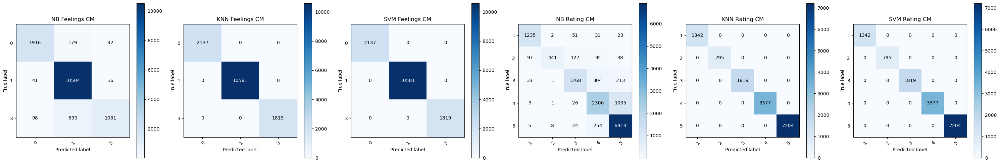

In [ ]:
# Crear un subplot para cada reporte de clasificación y matriz de confusión
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 5))

plot_confusion_matrix_on_ax(y_train_feelings, y_pred_train_NB_BM_feelings, classes=classes_feelings_NB, title='NB Feelings CM', ax=axes[0])
plot_confusion_matrix_on_ax(y_train_feelings, y_pred_train_KNN_BM_feelings, classes=classes_feelings_KNN, title='KNN Feelings CM', ax=axes[1])
plot_confusion_matrix_on_ax(y_train_feelings, y_pred_train_SVM_feelings, classes=classes_feelings_SVM, title='SVM Feelings CM', ax=axes[2])
plot_confusion_matrix_on_ax(y_train_rating, y_pred_train_NB_BM_rating, classes=classes_rating_NB, title='NB Rating CM', ax=axes[3])
plot_confusion_matrix_on_ax(y_train_rating, y_pred_train_KNN_BM_rating, classes=classes_rating_KNN, title='KNN Rating CM', ax=axes[4])
plot_confusion_matrix_on_ax(y_train_rating, y_pred_train_SVM_rating, classes=classes_rating_SVM, title='SVM Rating CM', ax=axes[5])

plt.tight_layout()
plt.show()

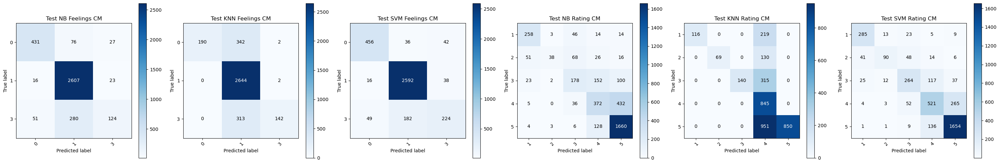

In [ ]:
# Crear un subplot para cada reporte de clasificación y matriz de confusión en el conjunto de prueba
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 5))


plot_confusion_matrix_on_ax(test['label'], y_pred_test_NB_GS_feelings, classes=classes_feelings_NB, title='Test NB Feelings CM', ax=axes[0])
plot_confusion_matrix_on_ax(test['label'], y_pred_test_KNN_GS_feelings, classes=classes_feelings_KNN, title='Test KNN Feelings CM', ax=axes[1])
plot_confusion_matrix_on_ax(test['label'], y_pred_test_SVM_GS_feelings, classes=classes_feelings_SVM, title='Test SVM Feelings CM', ax=axes[2])
plot_confusion_matrix_on_ax(test['rating'], y_pred_test_NB_GS_rating, classes=classes_rating_NB, title='Test NB Rating CM', ax=axes[3])
plot_confusion_matrix_on_ax(test['rating'], y_pred_test_KNN_GS_rating, classes=classes_rating_KNN, title='Test KNN Rating CM', ax=axes[4])
plot_confusion_matrix_on_ax(test['rating'], y_pred_test_SVM_GS_rating, classes=classes_rating_SVM, title='Test SVM Rating CM', ax=axes[5])

plt.tight_layout()
plt.show()

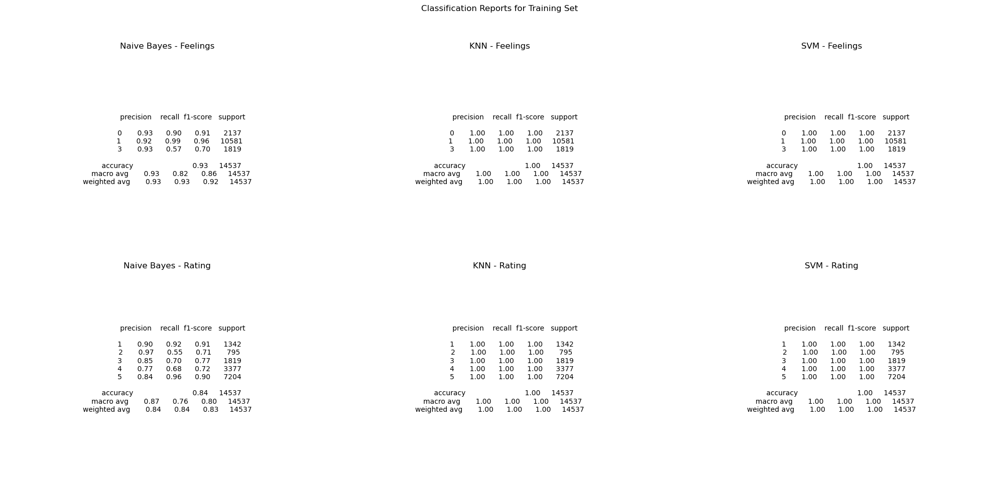

In [ ]:
report_NB_feelings_train = classification_report(y_train_feelings, y_pred_train_NB_BM_feelings, zero_division=0)
report_KNN_feelings_train = classification_report(y_train_feelings, y_pred_train_KNN_BM_feelings, zero_division=0)
report_SVM_feelings_train = classification_report(y_train_feelings, y_pred_train_SVM_feelings, zero_division=0)

report_NB_rating_train = classification_report(y_train_rating, y_pred_train_NB_BM_rating, zero_division=0)
report_KNN_rating_train = classification_report(y_train_rating, y_pred_train_KNN_BM_rating, zero_division=0)
report_SVM_rating_train = classification_report(y_train_rating, y_pred_train_SVM_rating, zero_division=0)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
fig.suptitle('Classification Reports for Training Set')

# Lista de todos los reportes y títulos para cada subplot
reports = [
    report_NB_feelings_train, report_KNN_feelings_train, report_SVM_feelings_train,
    report_NB_rating_train, report_KNN_rating_train, report_SVM_rating_train
]
titles = [
    "Naive Bayes - Feelings", "KNN - Feelings", "SVM - Feelings",
    "Naive Bayes - Rating", "KNN - Rating", "SVM - Rating"
]

for ax, report, title in zip(axes.flatten(), reports, titles):
    ax.text(0.5, 0.5, report, fontsize=10, ha='center', va='center', transform=ax.transAxes)
    ax.set_title(title)
    ax.axis('off')  #

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

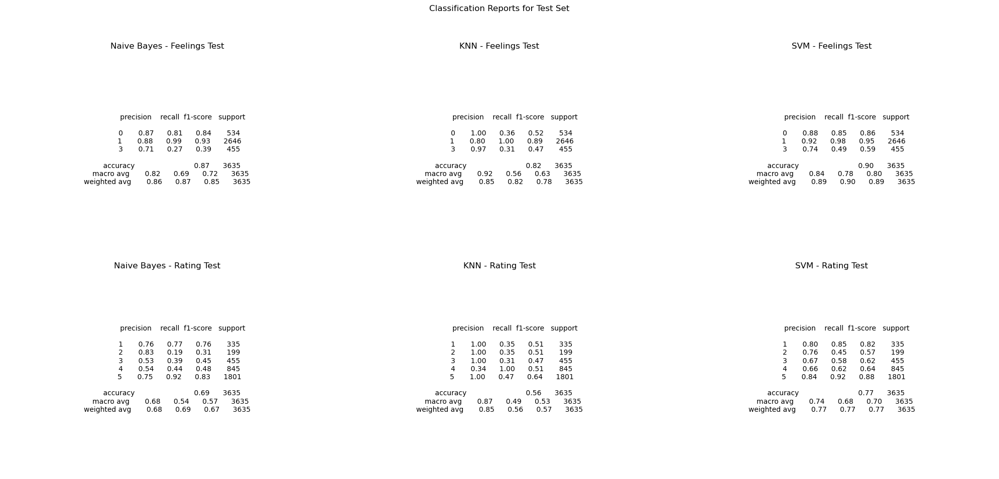

In [ ]:
report_NB_feelings_test = classification_report(test['label'], y_pred_test_NB_GS_feelings, zero_division=0)
report_KNN_feelings_test = classification_report(test['label'], y_pred_test_KNN_GS_feelings, zero_division=0)
report_SVM_feelings_test = classification_report(test['label'], y_pred_test_SVM_GS_feelings, zero_division=0)

report_NB_rating_test = classification_report(test['rating'], y_pred_test_NB_GS_rating, zero_division=0)
report_KNN_rating_test = classification_report(test['rating'], y_pred_test_KNN_GS_rating, zero_division=0)
report_SVM_rating_test = classification_report(test['rating'], y_pred_test_SVM_GS_rating, zero_division=0)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
fig.suptitle('Classification Reports for Test Set')

# Lista de todos los reportes y títulos para cada subplot
reports = [
    report_NB_feelings_test, report_KNN_feelings_test, report_SVM_feelings_test,
    report_NB_rating_test, report_KNN_rating_test, report_SVM_rating_test
]
titles = [
    "Naive Bayes - Feelings Test", "KNN - Feelings Test", "SVM - Feelings Test",
    "Naive Bayes - Rating Test", "KNN - Rating Test", "SVM - Rating Test"
]

for ax, report, title in zip(axes.flatten(), reports, titles):
    ax.text(0.5, 0.5, report, fontsize=10, ha='center', va='center', transform=ax.transAxes)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Al revisar la tabla comparativa, observamos el desempeño de los modelos Naive Bayes, KNN y SVM en dos conjuntos de pruebas: uno basado en las emociones o sentimientos (Feelings Test) y otro en la calificación numérica dada (Rating Test). Para evaluar el mejor rendimiento, consideramos las métricas de precisión, recall y el puntaje F1.

Para el Feelings Test:

*   Naive Bayes tiene una precisión promedio (macro avg) de 0.82 y un puntaje F1 de 0.72.
*   KNN tiene una precisión promedio de 0.92 pero un puntaje F1 más bajo de 0.63.
*   SVM sobresale con la precisión promedio más alta de 0.84 y el puntaje F1 más alto de 0.80.

Para el Rating Test:

*   Naive Bayes muestra una precisión promedio de 0.68 y un puntaje F1 de 0.57.
*   KNN muestra una precisión promedio de 0.87 pero un puntaje F1 también más bajo de 0.53.
*   SVM presenta una precisión promedio de 0.74 y un puntaje F1 de 0.70.

El puntaje F1 es una medida útil porque considera tanto la precisión como el recall, proporcionando un balance entre ambos, especialmente cuando las clases están desequilibradas.

Conclusión para Feelings Test:
El modelo SVM ofrece el mejor rendimiento general, con el puntaje F1 más alto que indica un buen equilibrio entre precisión y recall. KNN tiene una precisión alta pero un recall bajo, lo que sugiere que aunque cuando predice correctamente es muy confiable, se pierde muchos casos positivos (bajo recall).

Conclusión para Rating Test:
Nuevamente, el modelo SVM demuestra ser el más eficaz en términos de equilibrio general entre precisión y recall, como lo indica su puntaje F1. KNN muestra una alta precisión pero, similar al Feelings Test, su bajo recall disminuye su puntaje F1.

Mención honorífica para SVM:
El modelo SVM merece una mención especial, ya que consistentemente supera a los otros modelos en el puntaje F1 en ambos tests. Esto indica que SVM maneja bien tanto la clasificación binaria (sentimientos) como la multiclase (rating), equilibrando correctamente la detección de clases positivas y la precisión de sus predicciones solo con el uso del parámetro class_weight = 'balanced'.